# Analyze the cell-score results of SCDRS & scGWAS for RA

## 0. Prep colors and set up

In [1]:
meta_colors_mac <- c("M-0: MERTK+ SELENOP+ LYVE1+"="#d0b4dc",
                 "M-1: MERTK+ SELENOP+ LYVE1-"="#FCCDE5", 
                 "M-2: MERTK+ S100A8+"="#945cb4", 
                 "M-3: MERTK+ HBEGF+"="#842bd7", 
                 "M-4: SPP1+"="yellow4", 
                 "M-5: C1QA+"="#B38072",
                 "M-6: STAT1+ CXCL10+"="#d11141", 
                 "M-7: IL1B+ FCN1+ HBEGF+"="#FDB462", 
                 "M-8: PLCG2+"="grey", 
                 "M-9: DC3"="#1F78B4", 
                 "M-10: DC2"="#A6CEE3", 
                 "M-11: CD16+/DC4"="#66C2A4", 
                 "M-12: DC1"="#CCECE6",
                 "M-13: pDC"="#238B45", 
                 "M-14: LAMP3+"="#A1D99B")
meta_colors_mac <- c("M-0: MERTK+ SELENOP+ LYVE1+"="#d0b4dc",
                 "M-1: MERTK+ SELENOP+ LYVE1-"="#FCCDE5", 
                 "M-2: MERTK+ S100A8+"="#945cb4", 
                 "M-3: MERTK+ HBEGF+"="#842bd7", 
                 "M-4: SPP1+"="yellow4", 
                 "M-5: C1QA+"="#B38072",
                 "M-6: STAT1+ CXCL10+"="#d11141", 
                 "M-7: IL1B+ FCN1+ HBEGF+"="#FDB462", 
                 "M-8: PLCG2+"="grey", 
                 "M-9: DC3"="#1F78B4", 
                 "M-10: DC2"="#A6CEE3", 
                 "M-11: CD16+/DC4"="#66C2A4", 
                 "M-12: DC1"="#CCECE6",
                 "M-13: pDC"="#238B45", 
                 "M-14: LAMP3+"="#A1D99B")
meta_colors_fib <- c('F-0: PRG4+ CLIC5+ lining'='#A6CEE3',
                   'F-1: PRG4+ lining'='#1F78B4', 
                   'F-2: CD34+ sublining'='#B2DF8A', 
                   'F-3: POSTN+ sublining'='#33A02C', 
                   'F-4: DKK3+ sublining'='#E31A1C', 
                   'F-5: CD74-hi sublining'='#FB9A99', 
                   'F-6: CXCL12+ SFRP1+ sublining'='#FDBF6F', 
                   'F-7: NOTCH3+ sublining'='#FF7F00', 
                   'F-8: RSPO3+ intermediate'='#6495ED', 
                   'Mu-0: Mural'='#9932CC')

meta_colors_b <- c("B-0: CD24+CD27+CD11b+\n switched memory" = "#A6CEE3", 
                   "B-1: CD24++CD27+IgM+\n unswitched memory" = "#B2DF8A", 
                   "B-2: IgM+IgD+TCL1A+ naive" = "#FF7F00", 
                   "B-3: IgM+IgD+CD1c+ MZ-like" = "#1F78B4",
                   "B-4: AICDA+BCL6+ GC-like" = "#33A02C",
                   "B-5: CD11c+LAMP1+ ABC" = "#CAB2D6",
                   "B-6: IgM+ plasma" = "#FDBF6F", 
                   "B-7: HLA-DR+IgG+ plasmablast" = "brown",
                   "B-8: IgG1+IgG3+ plasma" = "#6A3D9A"
                   )

meta_colors_t <- c("T-0: CD4+ IL7R+ memory" = "#A6CEE3", "T-1: CD4+ CD161+ memory" = "#1F78B4", 
                 "T-2: CD4+ IL7R+CCR5+ memory" = "#B2DF8A", "T-3: CD4+ Tfh/Tph" = "#33A02C", 
                 "T-4: CD4+ naive" = "#FB9A99", "T-5: CD4+ GZMK+ memory" = "#E31A1C", 
                 "T-6: CD4+ memory" = "#FDBF6F", "T-7: CD4+ Tph" = "#FF7F00", 
                 "T-8: CD4+ CD25-high Treg" = "#CAB2D6", "T-9: CD4+ CD25-low Treg" = "#6A3D9A", 
                 "T-10: CD4+ OX40+NR3C1+" = "#FFFF99", "T-11: CD4+ CD146+ memory" = "#B15928", 
                 "T-12: CD4+ GNLY+" = "#B3E2CD", "T-13: CD8+ GZMK/B+ memory" = "#FDCDAC", 
                 "T-14: CD8+ GZMK+ memory" = "#CBD5E8", "T-15: CD8+ GZMB+/TEMRA" = "#F4CAE4",
                 "T-16: CD8+ CD45ROlow/naive" = "#1B9E77", "T-17: CD8+ activated/NK-like" = "#D95F02",
                 "T-18: Proliferating" = "#7570B3", "T-19: MT-high (low quality)" = "#E7298A", 
                 "T-20: CD38+" = "#66A61E", "T-21: Innate-like" = "#E6AB02", 
                 "T-22: Vdelta1" = "#A6761D", "T-23: Vdelta2" = "#666666")

meta_colors_nk <- c("NK-0: CD56dim CD16+ IFNG-" = "#9E0142", 
                    "NK-1: CD56dim CD16+ IFNG+CD160+" = "#D53E4F", 
                    "NK-2: CD56dim CD16+ IFNG+CD160-" = "#F46D43",
                    "NK-3: CD56dim CD16+ GZMB-" = "#FDAE61", 
                    "NK-4: CD56bright CD16- GZMA+CD160+" = "#FEE08B", 
                    "NK-5: CD56bright CD16- GZMA+CD69+" = "#FFFFBF", 
                    "NK-6: CD56bright CD16- GNLY+" = "#E6F598", 
                    "NK-7: CD56bright CD16- GNLY+CD69+" = "#ABDDA4", 
                    "NK-8: CD56bright CD16- IFN response" = "#66C2A5",
                    "NK-9: MT-high" = "#3288BD", 
                    "NK-10: PCNA+ Proliferating" = "grey",
                    "NK-11: MKI67+ Proliferating" = "dimgrey", 
                    "NK-12: IL7R+ ILC" = "#BEAED4", 
                    "NK-13: IL7R+CD161+ ILC" = "#5E4FA2")

meta_colors_end <- c("E-0: SPARC+ capillary" = "#8DD3C7", 
                     "E-1: LIFR+ venular" = "#BEBADA",
                     "E-2: ICAM1+ venular" = "#FB8072", 
                     "E-3: NOTCH4+ arteriolar" = "#80B1D3", 
                     "E-4: Lymphatic" = "#FDB462")
meta_colors <- c(meta_colors_b, meta_colors_end, meta_colors_fib, meta_colors_mac, meta_colors_t, meta_colors_nk)

meta_colors <- c(meta_colors_t, meta_colors_nk, 
                 meta_colors_mac, meta_colors_b,
                meta_colors_fib, meta_colors_end)

In [2]:
meta_colors_mac_num <- c("M-0"="#d0b4dc",
                 "M-1"="#FCCDE5", 
                 "M-2"="#945cb4", 
                 "M-3"="#842bd7", 
                 "M-4"="yellow4", 
                 "M-5"="#B38072",
                 "M-6"="#d11141", 
                 "M-7"="#FDB462", 
                 "M-8"="grey", 
                 "M-9"="#1F78B4", 
                 "M-10"="#A6CEE3", 
                 "M-11"="#66C2A4", 
                 "M-12"="#CCECE6",
                 "M-13"="#238B45", 
                 "M-14"="#A1D99B")
meta_colors_fib_num <- c('F-0'='#A6CEE3',
                   'F-1'='#1F78B4', 
                   'F-2'='#B2DF8A', 
                   'F-3'='#33A02C', 
                   'F-4'='#E31A1C', 
                   'F-5'='#FB9A99', 
                   'F-6'='#FDBF6F', 
                   'F-7'='#FF7F00', 
                   'F-8'='#6495ED', 
                   'Mu-0'='#9932CC')
meta_colors_b_num <- c("B-0" = "#A6CEE3", 
                   "B-1" = "#B2DF8A", 
                   "B-2" = "#FF7F00", 
                   "B-3" = "#1F78B4",
                   "B-4" = "#33A02C",
                   "B-5" = "#CAB2D6",
                   "B-6" = "#FDBF6F", 
                   "B-7" = "brown",
                   "B-8" = "#6A3D9A"
                   )

meta_colors_t_num <- c("T-0" = "#A6CEE3", "T-1" = "#1F78B4", 
                 "T-2" = "#B2DF8A", "T-3" = "#33A02C", 
                 "T-4" = "#FB9A99", "T-5" = "#E31A1C", 
                 "T-6" = "#FDBF6F", "T-7" = "#FF7F00", 
                 "T-8" = "#CAB2D6", "T-9" = "#6A3D9A", 
                 "T-10" = "#FFFF99", "T-11" = "#B15928", 
                 "T-12" = "#B3E2CD", "T-13" = "#FDCDAC", 
                 "T-14" = "#CBD5E8", "T-15" = "#F4CAE4",
                 "T-16" = "#1B9E77", "T-17" = "#D95F02",
                 "T-18" = "#7570B3", "T-19" = "#E7298A", 
                 "T-20" = "#66A61E", "T-21" = "#E6AB02", 
                 "T-22" = "#A6761D", "T-23" = "#666666")

meta_colors_nk_num <- c("NK-0" = "#9E0142", 
                    "NK-1" = "#D53E4F", 
                    "NK-2" = "#F46D43",
                    "NK-3" = "#FDAE61", 
                    "NK-4" = "#FEE08B", 
                    "NK-5" = "#FFFFBF", 
                    "NK-6" = "#E6F598", 
                    "NK-7" = "#ABDDA4", 
                    "NK-8" = "#66C2A5",
                    "NK-9" = "#3288BD", 
                    "NK-10" = "grey",
                    "NK-11" = "dimgrey", 
                    "NK-12" = "#BEAED4", 
                    "NK-13" = "#5E4FA2")

meta_colors_end_num <- c("E-0" = "#8DD3C7", 
                     "E-1" = "#BEBADA",
                     "E-2" = "#FB8072", 
                     "E-3" = "#80B1D3", 
                     "E-4" = "#FDB462")
meta_colors_num <- c(meta_colors_mac_num, meta_colors_fib_num, meta_colors_t_num, meta_colors_b_num, meta_colors_nk_num, meta_colors_end_num)

In [3]:
meta_colors_macro <- c("B cell" = "#9b543e", 
                      "Fibroblast" = "#A6CEE3", 
                      "Endothelial" = "#1c7ab6", 
                      "Myeloid" = "#f08176", 
                      "NK" = "#744ea4", 
                      "T cell" = "#c8b2d6")

In [4]:
meta_colors1 <- list(meta_colors_end, meta_colors_fib, 
                     meta_colors_b, meta_colors_mac,
                     meta_colors_nk, meta_colors_t)

In [5]:
library(data.table)
library(ggplot2)
library(cowplot)
library(tidyverse)
library(ggnewscale)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ tibble  3.2.1     ✔ dplyr   1.1.2
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.3     ✔ forcats 1.0.0
✔ purrr   1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::between()   masks data.table::between()
✖ dplyr::filter()    masks stats::filter()
✖ dplyr::first()     masks data.table::first()
✖ dplyr::lag()       masks stats::lag()
✖ dplyr::last()      masks data.table::last()
✖ purrr::transpose() masks data.table::transpose()


## 1. Reaad in data

In [6]:
data_dir <- "/Users/hopekirby/Desktop/SC_GWAS_Bench/data/SC_data/amp2/"
meta_data <- readRDS(paste0(data_dir, "meta_qc_amp2RA_exp_norm_2023_06_13.rds"))
output_dir <- "/Users/hopekirby/Desktop/SC_GWAS_Bench/output/SCDRS/RA_53/"
output_dir2 <- "/Users/hopekirby/Desktop/SCRNA-GWAS-Benchmarking/output/scDRS_reruns/"
cell_score <- data.frame(fread(paste0(output_dir, "RA.score.gz")))
dim(meta_data)
dim(cell_score)

[1] 262696     14

[1] 262696      7

In [7]:
# add cell scores to meta data
rownames(cell_score) <- cell_score$V1
cell_score <- cell_score[meta_data$cell,]
identical(cell_score$V1, meta_data$cell)
meta_data <- cbind(meta_data, cell_score)
any(is.na(cell_score))

[1] TRUE

[1] FALSE

In [8]:
# read in macro & micro tables
output_dir <- "/Users/hopekirby/Desktop/SC_GWAS_Bench/output/SCDRS/RA_53/"
micro_table <- fread(paste0(output_dir, "RA.scdrs_group.cell_type_micro"))
macro_table <- fread(paste0(output_dir, "RA.scdrs_group.cell_type_macro"))

## 2. Prep Data

In [45]:
# add spaces to the long clusters
add_spaces_dict <- c("B-0: CD24+CD27+CD11b+\n switched memory", 
                    "B-1: CD24++CD27+IgM+\n unswitched memory")
names(add_spaces_dict) <- c("B-0: CD24+CD27+CD11b+ switched memory", "B-1: CD24++CD27+IgM+ unswitched memory")
setdiff(names(add_spaces_dict), meta_data$cluster_name)
meta_data$cluster_name2 <- as.character(meta_data$cluster_name)
micro_table$group2 <- as.character(micro_table$group)
for (cell_group in names(add_spaces_dict)) {
    print(add_spaces_dict[cell_group])
    print(dim(meta_data[meta_data$cluster_name == cell_group,]))
    meta_data[meta_data$cluster_name == cell_group,]$cluster_name2 <- add_spaces_dict[cell_group]
    micro_table[micro_table$group == cell_group,]$group2 <- add_spaces_dict[cell_group]
    }

character(0)

    B-0: CD24+CD27+CD11b+ switched memory 
"B-0: CD24+CD27+CD11b+\n switched memory" 
[1] 5606   24
    B-1: CD24++CD27+IgM+ unswitched memory 
"B-1: CD24++CD27+IgM+\n unswitched memory" 
[1] 2958   24


### Get rankings of cell clusters within cell types according to Z scores

In [10]:
# list to add the ranked clusters within cell types
ranked_cell_clusters <- c()
for (cell_type in meta_colors1) {
    # get the ranked cells in that group
    data <- micro_table[micro_table$group2 %in% names(cell_type),]
    data <- data[order(assoc_mcz),]
    # now add the ranked cells to a list
    ranked_cell_clusters <- c(ranked_cell_clusters, data$group2)
    } 

In [11]:
sig_cell_clusters <- micro_table[micro_table$assoc_mcp < 0.05,]$group2
length(sig_cell_clusters)

[1] 46

In [12]:
# make a dictionary of the cluster name and number
cluster_num_dict <- unique(meta_data$cluster_number)
names(cluster_num_dict) <- unique(meta_data$cluster_name2)

# list to add the ranked clusters within cell types
ranked_cell_numbers <- c()
for (cell_type in ranked_cell_clusters) {
    ranked_cell_numbers <- c(ranked_cell_numbers, cluster_num_dict[[cell_type]])
    } 
ranked_cell_clusters[1:5]
ranked_cell_numbers[1:5]

[1] "E-1: LIFR+ venular"      "E-3: NOTCH4+ arteriolar"
[3] "E-0: SPARC+ capillary"   "E-2: ICAM1+ venular"    
[5] "E-4: Lymphatic"

[1] "E-1" "E-3" "E-0" "E-2" "E-4"

In [13]:
data_summary <- function(x) {
   m <- mean(x)
   ymin <- m-sd(x)
   ymax <- m+sd(x)
   return(c(y=m,ymin=ymin,ymax=ymax))
}

In [14]:
## Ensure the names are matching
setdiff(meta_data$cluster_name2, micro_table$group2)
setdiff(micro_table$group2, meta_data$cluster_name2)
setdiff(ranked_cell_clusters, meta_data$cluster_name2)
setdiff(meta_data$cluster_name2, ranked_cell_clusters)
setdiff(ranked_cell_clusters, micro_table$group2)

character(0)

character(0)

character(0)

character(0)

character(0)

### Add z scores to metadata

In [15]:
# add the micro_table z-score to metadata
micro_table[1:2,]
meta_data$Z_score <- rep(NA, nrow(meta_data))
for (cell_group in micro_table$group2) {
    # get the z score to put there
    meta_data[meta_data$cluster_name2 == cell_group,]$Z_score <- micro_table[micro_table$group2 == cell_group,]$assoc_mcz
    }
meta_data[50:52,]

group,n_cell,n_ctrl,assoc_mcp,assoc_mcz,hetero_mcp,hetero_mcz,n_fdr_0.05,n_fdr_0.1,n_fdr_0.2,group2
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
B-0: CD24+CD27+CD11b+ switched memory,5606,1000,0.01998002,2.267116,0.001998002,4.987217,47,136,372,B-0: CD24+CD27+CD11b+ switched memory
B-1: CD24++CD27+IgM+ unswitched memory,2958,1000,0.04995005,1.707947,0.002997003,3.731718,16,63,141,B-1: CD24++CD27+IgM+ unswitched memory


,sample,cell,cluster_number,cluster_name,cell_type,subject_id,percent.mito,nGene,nUMI,redcap_data_access_group,⋯,Race_white,V1,raw_score,norm_score,mc_pval,pval,nlog10_pval,zscore,cluster_name2,Z_score
,<chr>,<chr>,<chr>,<fct>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>,⋯,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
BRI-403_AAGCCATGTTCTCGTC,BRI-403,BRI-403_AAGCCATGTTCTCGTC,B-8,B-8: IgG1+IgG3+ plasma,B cell,300-0150,0.08900862,2590,13920,university_of_roch,⋯,1,BRI-403_AAGCCATGTTCTCGTC,0.07630106,-0.4833566,0.6503497,0.6788663,0.1682158,-0.4645308,B-8: IgG1+IgG3+ plasma,-1.5384771
BRI-403_AAGCGAGAGCTCTATG,BRI-403,BRI-403_AAGCGAGAGCTCTATG,B-7,B-7: HLA-DR+IgG+ plasmablast,B cell,300-0150,0.04972008,2866,33045,university_of_roch,⋯,1,BRI-403_AAGCGAGAGCTCTATG,0.07018765,-1.0323110,0.8971029,0.8508133,0.0701657,-1.0399281,B-7: HLA-DR+IgG+ plasmablast,-0.4048466
BRI-403_AAGCGAGTCCCAAGTA,BRI-403,BRI-403_AAGCGAGTCCCAAGTA,B-1,B-1: CD24++CD27+IgM+ unswitched memory,B cell,300-0150,0.19950565,1526,5664,university_of_roch,⋯,1,BRI-403_AAGCGAGTCCCAAGTA,0.08598852,0.8654230,0.1868132,0.1906696,0.7197185,0.8754314,B-1: CD24++CD27+IgM+ unswitched memory,1.7079468


In [16]:
macro_table[1:2,]
meta_data$Z_score_macro <- rep(NA, nrow(meta_data))
for (cell_group in macro_table$group) {
    # get the z score to put there
    meta_data[meta_data$cell_type == cell_group,]$Z_score_macro <- macro_table[macro_table$group == cell_group,]$assoc_mcz
    
    }
meta_data[50:52,]

group,n_cell,n_ctrl,assoc_mcp,assoc_mcz,hetero_mcp,hetero_mcz,n_fdr_0.05,n_fdr_0.1,n_fdr_0.2
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
B cell,26771,1000,0.0969031,1.442866,0.002997003,2.803563,234,571,1445
Endothelial,18241,1000,0.9510490,-1.512432,0.002997003,4.319029,3,7,45


,sample,cell,cluster_number,cluster_name,cell_type,subject_id,percent.mito,nGene,nUMI,redcap_data_access_group,⋯,V1,raw_score,norm_score,mc_pval,pval,nlog10_pval,zscore,cluster_name2,Z_score,Z_score_macro
,<chr>,<chr>,<chr>,<fct>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>,⋯,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
BRI-403_AAGCCATGTTCTCGTC,BRI-403,BRI-403_AAGCCATGTTCTCGTC,B-8,B-8: IgG1+IgG3+ plasma,B cell,300-0150,0.08900862,2590,13920,university_of_roch,⋯,BRI-403_AAGCCATGTTCTCGTC,0.07630106,-0.4833566,0.6503497,0.6788663,0.1682158,-0.4645308,B-8: IgG1+IgG3+ plasma,-1.5384771,1.442866
BRI-403_AAGCGAGAGCTCTATG,BRI-403,BRI-403_AAGCGAGAGCTCTATG,B-7,B-7: HLA-DR+IgG+ plasmablast,B cell,300-0150,0.04972008,2866,33045,university_of_roch,⋯,BRI-403_AAGCGAGAGCTCTATG,0.07018765,-1.0323110,0.8971029,0.8508133,0.0701657,-1.0399281,B-7: HLA-DR+IgG+ plasmablast,-0.4048466,1.442866
BRI-403_AAGCGAGTCCCAAGTA,BRI-403,BRI-403_AAGCGAGTCCCAAGTA,B-1,B-1: CD24++CD27+IgM+ unswitched memory,B cell,300-0150,0.19950565,1526,5664,university_of_roch,⋯,BRI-403_AAGCGAGTCCCAAGTA,0.08598852,0.8654230,0.1868132,0.1906696,0.7197185,0.8754314,B-1: CD24++CD27+IgM+ unswitched memory,1.7079468,1.442866


## 3. Plot scDRS results

[1] "T cell"  "Myeloid" "NK"      "B cell"

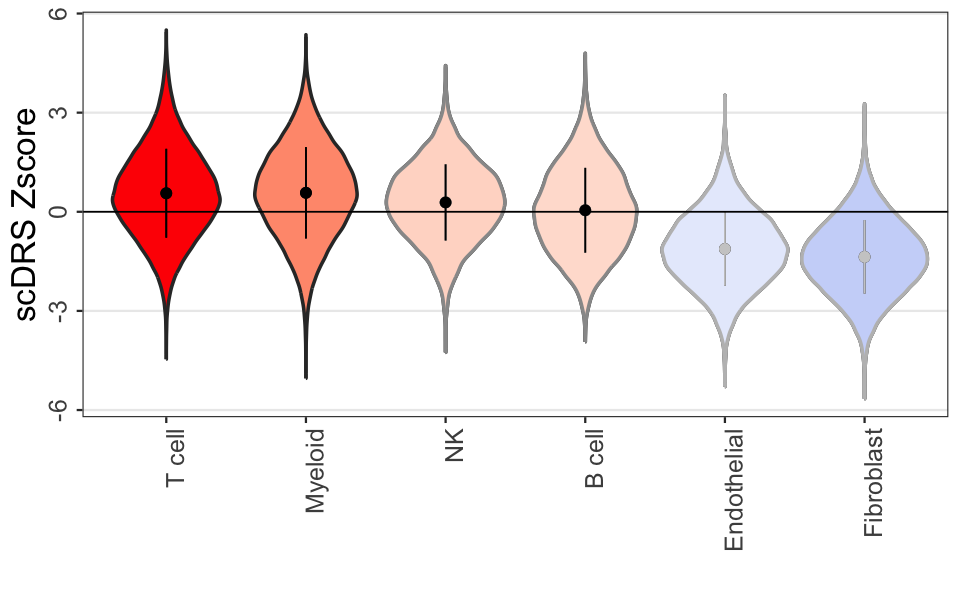

In [112]:
sig_cell_types <- macro_table[macro_table$assoc_mcp < 0.1]$group
sig_cell_types
sig_cell_types_5 <- macro_table[macro_table$assoc_mcp < 0.05]$group
data3 = meta_data[!meta_data$cell_type %in% sig_cell_types,]
data2 = meta_data[!meta_data$cell_type %in% sig_cell_types_5,]
options(repr.plot.height = 5, repr.plot.width =8 )
ggplot(meta_data, aes(x=factor(cell_type, levels=c("T cell", "Myeloid", "NK", "B cell", "Endothelial", "Fibroblast")), y=zscore, fill=Z_score_macro)) +
geom_violin(data=meta_data, linewidth=1) +  
geom_violin(data=data2, color="grey60", linewidth=1, aes(fill=Z_score_macro)) + 
stat_summary(fun.data=data_summary) + stat_summary(data=data2, fun.data=data_summary, color="grey80") + 
geom_violin(data=data3, color="grey", linewidth=1, aes(fill=Z_score_macro)) + 
stat_summary(fun.data=data_summary) + stat_summary(data=data3, fun.data=data_summary, color="grey80") + 
geom_hline(yintercept=0, color="black") +
theme_bw(base_size=14) + 
theme(legend.position="None", 
      axis.text.x = element_text(angle=90, size=15, hjust=1), 
     panel.grid.major.x = element_blank(), panel.grid.minor.x = element_blank(), panel.grid.minor.y = element_blank(),
     axis.text.y = element_text(angle=90, size = 15,vjust=1,hjust=0.5), axis.title=element_text(size=20)) + #ylim(-6,5.3)  +
theme(strip.background=element_rect(colour="black",
                                    fill="lightgrey"),strip.text = element_text(size = 18, margin = margin()))  +
scale_fill_gradient2(low="cornflowerblue", mid="white", high="red", midpoint=0)  + labs(y="scDRS Zscore",x='')

ggsave("../../output//Final_figures/RA/scDRS_macro_RA_Zscores.pdf", height=5, width=8)

In [116]:
min(meta_data$zscore)
max(meta_data$zscore)

[1] -5.658989

[1] 5.499593

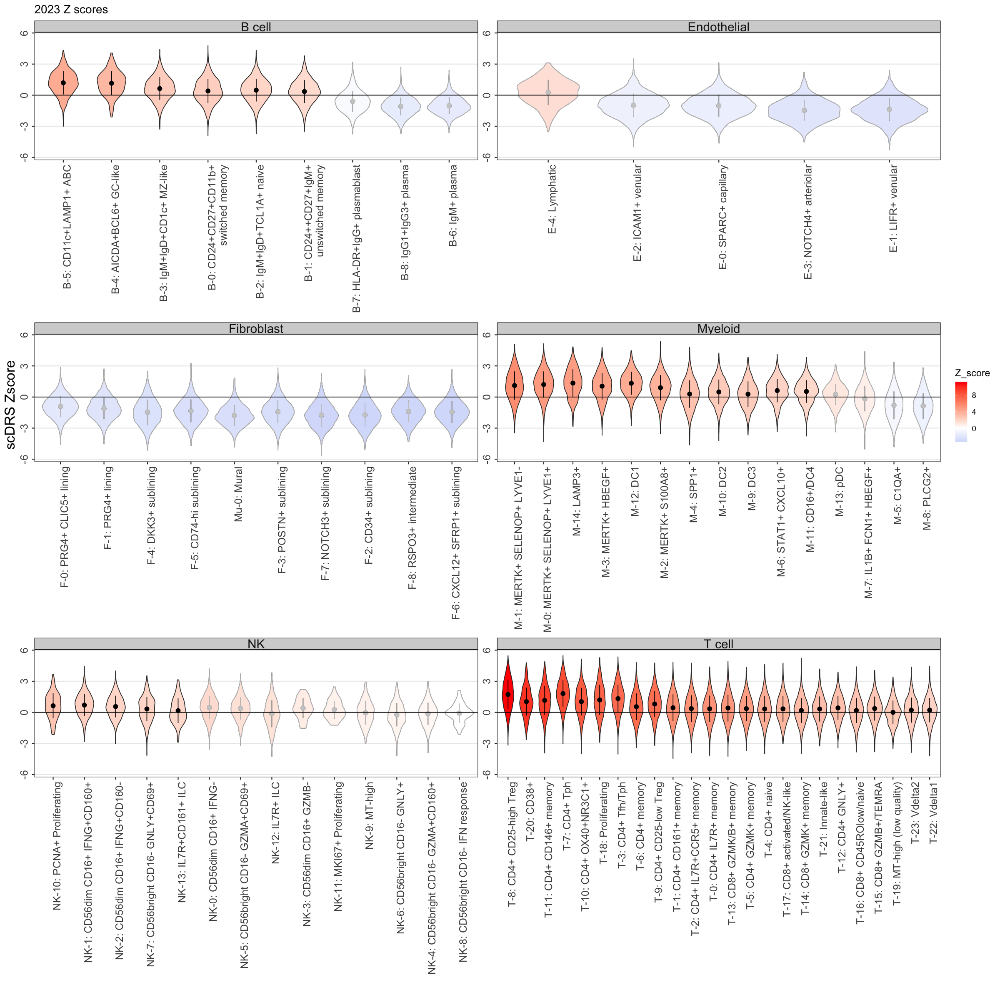

In [135]:
data2 = meta_data[!meta_data$cluster_name2 %in% sig_cell_clusters,]
options(repr.plot.height = 20, repr.plot.width =20 ) #[meta_data$pval < 0.1,]
ggplot(meta_data, aes(x=factor(cluster_name2, levels=rev(ranked_cell_clusters)), y=zscore, fill=Z_score)) +
geom_violin(data=meta_data, linewidth=0.5) +  
geom_violin(data=data2, color="grey", linewidth=0.5, aes(fill=Z_score)) + 
stat_summary(fun.data=data_summary) + stat_summary(data=data2, fun.data=data_summary, color="grey80") + 
geom_hline(yintercept=0, color="black") +
theme_bw(base_size=14) + 
theme( 
      axis.text.x = element_text(angle=90, size=15, hjust=1), 
     panel.grid.major.x = element_blank(), panel.grid.minor.x = element_blank(), panel.grid.minor.y = element_blank(),
     axis.text.y = element_text(angle=90, size = 15,vjust=1,hjust=0.5), axis.title=element_text(size=20)) + ylim(-5.7,5.5)  +
facet_wrap(vars(factor(cell_type)),nrow=3,scales="free") + ggtitle("2023 Z scores") + 
theme(strip.background=element_rect(colour="black",
                                    fill="lightgrey"),strip.text = element_text(size = 18, margin = margin()))  +
scale_fill_gradient2(low="cornflowerblue", mid="white", high="red", midpoint=0)  + labs(y="scDRS Zscore",x='')
ggsave("../../output/Final_figures/RA/scDRS_RA_Zscores_samey.pdf", height=20, width=20)

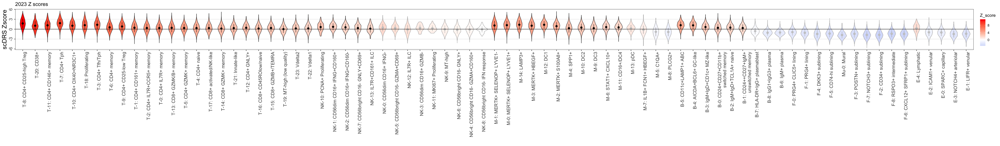

In [136]:

data2 = meta_data[!meta_data$cluster_name2 %in% sig_cell_clusters,]
options(repr.plot.height = 6.6, repr.plot.width =45 ) #[meta_data$pval < 0.1,]
ggplot(meta_data, aes(x=factor(cluster_name2, levels=rev(ranked_cell_clusters)), y=zscore, fill=Z_score)) +
geom_violin(data=meta_data, linewidth=0.5) +  
geom_violin(data=data2, color="grey", linewidth=0.5, aes(fill=Z_score)) + 
stat_summary(fun.data=data_summary) + stat_summary(data=data2, fun.data=data_summary, color="grey80") + 
geom_hline(yintercept=0, color="black") +
theme_bw(base_size=14) + 
theme( 
      axis.text.x = element_text(angle=90, size=15, hjust=1), 
     panel.grid.major.x = element_blank(), panel.grid.minor.x = element_blank(), panel.grid.minor.y = element_blank(),
     axis.text.y = element_text(angle=90, size = 15,vjust=1,hjust=0.5), axis.title=element_text(size=20)) + ylim(-5.7,5.5)  +
ggtitle("2023 Z scores") + 
theme(strip.background=element_rect(colour="black",
                                    fill="lightgrey"),strip.text = element_text(size = 18, margin = margin()))  +
scale_fill_gradient2(low="cornflowerblue", mid="white", high="red", midpoint=0)  + labs(y="scDRS Zscore",x='')
ggsave("../../output/Final_figures/RA/scDRS_RA_Zscores_samey.pdf", height=6.6, width=45)

## 4. Plot scGWAS Results

#### Read in sgwas data and fix names

In [20]:
scgwas_dir <- "/Users/hopekirby/Desktop/SC_GWAS_Bench/output/scGWAS/"
scgwas_macro <- fread(paste0(scgwas_dir, "RA_signif_celltypes_2023.sig_module.txt"))
scgwas_micro <- fread(paste0(scgwas_dir, "RA_signif_clusters_2023.sig_module.txt"))
# create a table with the number of groups for each cell_type
scgwas_macro_count <- data.frame(table(scgwas_macro$cell_type))
scgwas_micro_count <- data.frame(table(scgwas_micro$cell_type))
scgwas_macro_count


replace_dict <- c("M-11: CD16+-DC4" = "M-11: CD16+/DC4", 'T-3: CD4+ Tfh-Tph' = 'T-3: CD4+ Tfh/Tph', 
                  'T-13: CD8+ GZMK-B+ memory' = 'T-13: CD8+ GZMK/B+ memory', 
                  'T-15: CD8+ GZMB+-TEMRA' = 'T-15: CD8+ GZMB+/TEMRA', 'T-16: CD8+ CD45ROlow-naive' = 'T-16: CD8+ CD45ROlow/naive', 
                  'T-17: CD8+ activated-NK-like' = 'T-17: CD8+ activated/NK-like', 
                 "B-0: CD24+CD27+CD11b+ switched memory" = "B-0: CD24+CD27+CD11b+\n switched memory", 
                 "B-1: CD24++CD27+IgM+ unswitched memory" = "B-1: CD24++CD27+IgM+\n unswitched memory")

# fix any misnames
Var2 <- c()
for (cluster in scgwas_micro_count$Var1) {
    if (cluster %in% names(replace_dict)) {
        Var2 <- c(Var2, replace_dict[cluster])
        }
    else {
        Var2 <- c(Var2, cluster)
        }
    }
scgwas_micro_count$Var1 <- Var2



Var1,Freq
<fct>,<int>
B cell,1
NK,2
T cell,3


In [22]:
length(setdiff(scgwas_micro_count$Var1, names(meta_colors)))
length(setdiff(scgwas_micro_count$Var1, micro_table$group))
length(setdiff(scgwas_micro_count$Var1, micro_table$group2))
length(setdiff(scgwas_macro_count$Var1, names(meta_colors_macro)))
length(setdiff(scgwas_macro_count$Var1, macro_table$group))

[1] 0

[1] 0

[1] 0

[1] 0

[1] 0

#### Add cell type info to scgwas data

In [23]:
# add cell type to scgwas_micro

cell_type_dict <- meta_data$cell_type
names(cell_type_dict) <- meta_data$cluster_num
cluster_dict <- meta_data$cluster_name
names(cluster_dict) <- meta_data$cluster_num

scgwas_macro_graph <- scgwas_macro[,c("cell_type", "module_score_z")]
scgwas_macro_graph
# add if not then
add_df <- data.frame(data.table("cell_type"=setdiff(macro_table$group, scgwas_macro$cell_type), 
                                "module_score_z"=rep(0, length(setdiff(macro_table$group, scgwas_macro$cell_type)))))

scgwas_macro_graph <- rbind(scgwas_macro_graph, add_df)    
# add cell type name and z_score
cell_types <- c()
Z_scores <- c()
for (cell_group in scgwas_macro_graph$cell_type) {
    Z_scores <- c(Z_scores, macro_table[macro_table$group == cell_group,]$assoc_mcz)
    }
scgwas_macro_graph$Z_score <- Z_scores
scgwas_macro_graph

cell_type,module_score_z
<chr>,<dbl>
B cell,3.144241
NK,2.819319
NK,2.802139
T cell,2.940912
T cell,2.914679
T cell,3.102704


cell_type,module_score_z,Z_score
<chr>,<dbl>,<dbl>
B cell,3.144241,1.442866
NK,2.819319,1.713575
NK,2.802139,1.713575
T cell,2.940912,8.762294
T cell,2.914679,8.762294
T cell,3.102704,8.762294
Endothelial,0.000000,-1.512432
Fibroblast,0.000000,-3.193880
Myeloid,0.000000,4.556192


In [24]:
setdiff(scgwas_macro_graph$cell_type, macro_table$group)

character(0)

Warning message:
“Removed 3 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 3 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 3 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 3 rows containing missing values (`geom_point()`).”


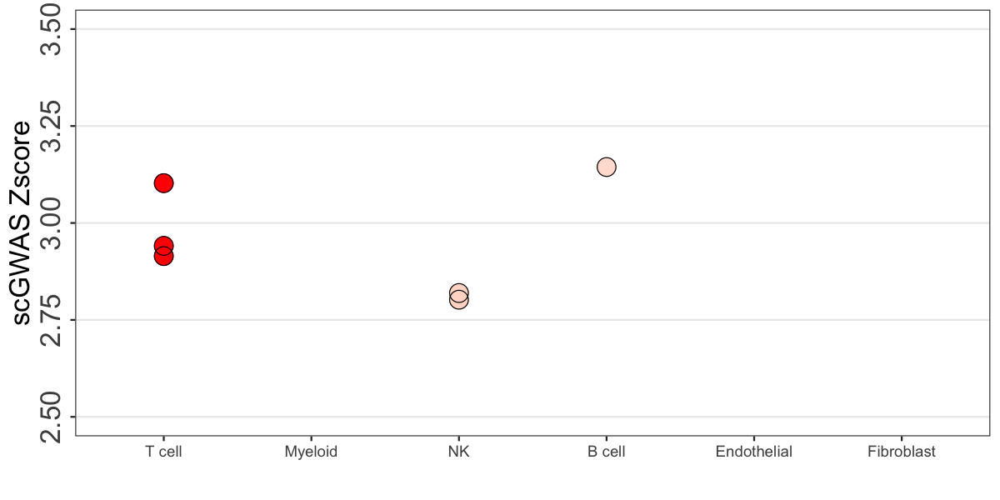

In [109]:

options(repr.plot.height = 5, repr.plot.width =10 ) #[meta_data$pval < 0.1,]
ggplot(scgwas_macro_graph, aes(x=factor(cell_type, levels=macro_table$group), y=module_score_z, color=Z_score))+ #fill=cell_type)) +
geom_point(size=6) +  geom_point(shape = 1,size = 6,colour = "black") +
#stat_summary(fun.data=data_summary) + #stat_summary(data=data2, fun.data=data_summary, color="grey40") + 
theme_bw(base_size=14) + 
theme(legend.position="None", 
      #axis.text.x = element_text(angle=90, size=15), 
     panel.grid.major.x = element_blank(), panel.grid.minor.x = element_blank(), panel.grid.minor.y = element_blank(),
     axis.text.y = element_text(angle=90, size = 20,vjust=1,hjust=0.5), axis.title=element_text(size=20)) + 
theme(strip.background=element_rect(colour="black",
                                    fill="lightgrey"),strip.text = element_text(size = 18, margin = margin()))  + ylim(2.5, 3.5
                                                                                                            ) +
 scale_color_gradient2(low="cornflowerblue", mid="white", high="red", midpoint=0) +labs(y="scGWAS Zscore",x='') 
ggsave("../../output/Final_figures/RA/scDRS_RA_macro_scGWAS_scores.pdf", height=5, width=10)

In [26]:
# add cell type to scgwas_micro
scgwas_micro_graph <- scgwas_micro[,c("cell_type", "module_score_z")]
scgwas_micro_graph$cell_type <- str_split_fixed(scgwas_micro_graph$cell_type, 
                                                ":",2)[,1]
# add if not then
add_df <- data.frame(data.table("cell_type"=setdiff(ranked_cell_numbers, scgwas_micro$cell_type), 
                                "module_score_z"=rep(0, length(setdiff(ranked_cell_numbers, scgwas_micro$cell_type)))))

scgwas_micro_graph <- rbind(scgwas_micro_graph, add_df)    
# add cell type name and z_score
cell_types <- c()
Z_scores <- c()
for (cluster in scgwas_micro_graph$cell_type) {
    cell_types <- c(cell_types, cell_type_dict[cluster])
    Z_scores <- c(Z_scores, micro_table[micro_table$group == cluster_dict[cluster],]$assoc_mcz)
    }
scgwas_micro_graph$macro <- cell_types
scgwas_micro_graph$Z_score <- Z_scores
scgwas_micro_graph[1:3,]

cell_type,module_score_z,macro,Z_score
<chr>,<dbl>,<chr>,<dbl>
B-2,3.129591,B cell,1.990577
B-3,2.880466,B cell,2.389095
B-4,2.517398,B cell,3.386966


Warning message:
“Removed 77 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 77 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 77 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 77 rows containing missing values (`geom_point()`).”


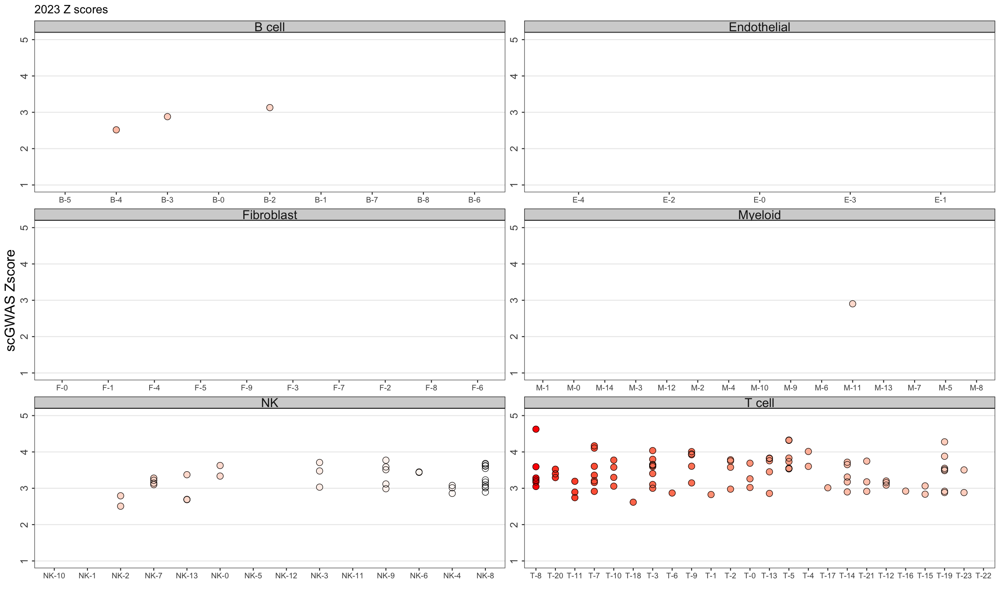

In [110]:

options(repr.plot.height = 12, repr.plot.width =20 ) #[meta_data$pval < 0.1,]
ggplot(scgwas_micro_graph, aes(x=factor(cell_type, levels=rev(ranked_cell_numbers)), y=module_score_z, color=Z_score))+ #fill=cell_type)) +
geom_point(size=4) +  geom_point(shape = 1,size = 4,colour = "black") +
#stat_summary(fun.data=data_summary) + #stat_summary(data=data2, fun.data=data_summary, color="grey40") + 
theme_bw(base_size=14) + 
theme(legend.position="None", 
      #axis.text.x = element_text(angle=90, size=15), 
     panel.grid.major.x = element_blank(), panel.grid.minor.x = element_blank(), panel.grid.minor.y = element_blank(),
     axis.text.y = element_text(angle=90, size = 15,vjust=1,hjust=0.5), axis.title=element_text(size=20)) + #ylim(-6,5.3)  +
facet_wrap(vars(macro),nrow=3,scales="free") + ggtitle("2023 Z scores") + 
theme(strip.background=element_rect(colour="black",
                                    fill="lightgrey"),strip.text = element_text(size = 18, margin = margin()))  +
 scale_color_gradient2(low="cornflowerblue", mid="white", high="red", midpoint=0) +labs(y="scGWAS Zscore",x='') + ylim(1, 5)
ggsave("../../output/Final_figures/RA/scDRS_RA_scGWAS_scores.pdf", height=12, width=20)

In [131]:
scgwas_micro_graph[1:2,]

,cell_type,module_score_z,macro,Z_score
,<chr>,<dbl>,<chr>,<dbl>
1,B-2,3.129591,B cell,1.990577
2,B-3,2.880466,B cell,2.389095


Warning message:
“Removed 77 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 77 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 77 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 77 rows containing missing values (`geom_point()`).”


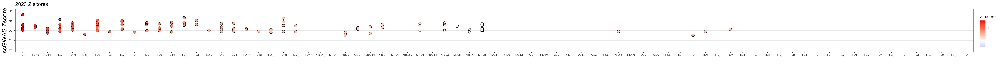

In [134]:

options(repr.plot.height = 3, repr.plot.width =45 ) #[meta_data$pval < 0.1,]
ggplot(scgwas_micro_graph, aes(x=factor(cell_type, levels=rev(ranked_cell_numbers)), y=module_score_z, color=Z_score))+ #fill=cell_type)) +
geom_point(size=4) +  geom_point(shape = 1,size = 4,colour = "black") +
#stat_summary(fun.data=data_summary) + #stat_summary(data=data2, fun.data=data_summary, color="grey40") + 
theme_bw(base_size=14) + 
theme(#legend.position="None", 
      #axis.text.x = element_text(angle=90, size=15), 
     panel.grid.major.x = element_blank(), panel.grid.minor.x = element_blank(), panel.grid.minor.y = element_blank(),
     axis.text.y = element_text(angle=90, size = 15,vjust=1,hjust=0.5), axis.title=element_text(size=20)) + #ylim(-6,5.3)  +
ggtitle("2023 Z scores") + 
theme(strip.background=element_rect(colour="black",
                                    fill="lightgrey"),strip.text = element_text(size = 18, margin = margin()))  +
 scale_color_gradient2(low="cornflowerblue", mid="white", high="red", midpoint=0) +labs(y="scGWAS Zscore",x='') + ylim(1, 5)
ggsave("../../output/Final_figures/RA/scDRS_RA_scGWAS_scores_samey.pdf", height=3, width=45)

In [28]:
# Ensure no NAs
scgwas_micro_graph <- data.frame(scgwas_micro_graph)
scgwas_micro_graph[is.na(scgwas_micro_graph),]

cell_type,module_score_z,macro,Z_score
<chr>,<dbl>,<chr>,<dbl>


## 5. Adding ranks of the cell clusters within each cell type (scGWAS & scDRS)
1. For scGWAS, I consider the # of significant pathways
2. For scDRS, I consider the proportion of cells that are significant & the group Z score

### scGWAS

In [29]:
scgwas_micro_count <- scgwas_micro_count[order(-scgwas_micro_count$Freq),]
freq_dict = list()
rank = 1
# create a dictionary based on the numbers provided:
for (freq in unique(scgwas_micro_count$Freq)) {
    freq_dict[freq] = rank
    rank = rank + 1
    }
rank_freq_list = c()
# then change the rank_freq
for (freq in scgwas_micro_count$Freq) {
    rank_freq_list <- c(rank_freq_list, freq_dict[freq])
    }
scgwas_micro_count$rank_freq <- rank_freq_list

scgwas_micro_count$rank_freq <- as.character(scgwas_micro_count$rank_freq)
unique(scgwas_micro_count$rank_freq)

scgwas_macro_count$rank_freq <- c(3,2,1)

[1] "1" "2" "3" "4" "5" "6" "7" "8" "9"

In [30]:
# add the groups that have 0 counts to the thing
# add the groups that have 0 counts to the thing
scgwas_0_list <- c(setdiff(names(meta_colors_macro), scgwas_macro_count$Var1))
Var1 <- as.vector(scgwas_macro_count$Var1)
new_Var1 <- c(Var1, scgwas_0_list)
new_Freq <- c(scgwas_macro_count$Freq, rep(0, length(scgwas_0_list)))
new_rank_freq <- c(scgwas_macro_count$rank_freq, rep(" ", length(scgwas_0_list)))
scgwas_macro_count <- data.frame(group = new_Var1, 
                            Freq = new_Freq, 
                            rank_freq = new_rank_freq)
scgwas_macro_count[1:2,]

scgwas_0_list <- c(setdiff(names(meta_colors), scgwas_micro_count$Var1))
Var1 <- as.vector(scgwas_micro_count$Var1)
new_Var1 <- c(Var1, scgwas_0_list)
new_Freq <- c(scgwas_micro_count$Freq, rep(0, length(scgwas_0_list)))
new_rank_freq <- c(scgwas_micro_count$rank_freq, rep(" ", length(scgwas_0_list)))
scgwas_micro_count <- data.frame(group = new_Var1, 
                            Freq = new_Freq, 
                            rank_freq = new_rank_freq)
scgwas_micro_count[1:2,]

,group,Freq,rank_freq
,<chr>,<dbl>,<chr>
1,B cell,1,3
2,NK,2,2


,group,Freq,rank_freq
,<chr>,<dbl>,<chr>
1,NK-8: CD56bright CD16- IFN response,11,1
2,T-3: CD4+ Tfh/Tph,9,2


### scDRS

In [31]:
# calculate the proportion significant
micro_table$prop_sig <- (micro_table$n_fdr_0.05/micro_table$n_cell)*100
macro_table$prop_sig <- (macro_table$n_fdr_0.05/macro_table$n_cell)*100

In [32]:
# ordering tables and getting rank
macro_table <- macro_table[order(-macro_table$prop_sig),]
macro_table$rank_prop_sig <- seq(1, nrow(macro_table))
macro_table <- macro_table[order(-(macro_table$assoc_mcz)),]
macro_table$rank_assoc_mcz <- seq(1, nrow(macro_table))
macro_table[1:2,]

micro_table <- micro_table[order(-micro_table$prop_sig),]
micro_table$rank_prop_sig <- seq(1, nrow(micro_table))
micro_table <- micro_table[order(-abs(micro_table$assoc_mcz)),]
micro_table$rank_assoc_mcz <- seq(1, nrow(micro_table))
micro_table[1:2,]



group,n_cell,n_ctrl,assoc_mcp,assoc_mcz,hetero_mcp,hetero_mcz,n_fdr_0.05,n_fdr_0.1,n_fdr_0.2,prop_sig,rank_prop_sig,rank_assoc_mcz
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
T cell,86865,1000,0.000999001,8.762294,0.000999001,11.211103,3154,5683,10528,3.630922,1,1
Myeloid,65189,1000,0.000999001,4.556192,0.000999001,5.810294,2146,4284,8384,3.291966,2,2


group,n_cell,n_ctrl,assoc_mcp,assoc_mcz,hetero_mcp,hetero_mcz,n_fdr_0.05,n_fdr_0.1,n_fdr_0.2,group2,prop_sig,rank_prop_sig,rank_assoc_mcz
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<int>
T-8: CD4+ CD25-high Treg,2677,1000,0.000999001,11.200336,0.000999001,9.302625,490,743,1037,T-8: CD4+ CD25-high Treg,18.304072,1,1
T-20: CD38+,704,1000,0.000999001,9.600737,0.014985015,1.953064,48,84,154,T-20: CD38+,6.818182,8,2


## 6. Compare scGWAS & scDRS

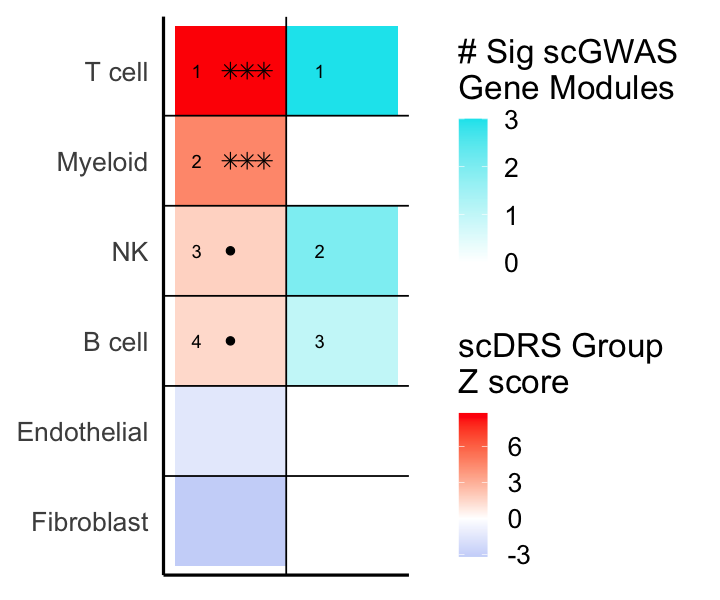

In [108]:
options(repr.plot.height = 5, repr.plot.width =6)
ggplot(macro_table) + 
geom_tile(aes(x=1, y=factor(group, levels=c("Fibroblast", "Endothelial", "B cell", 
                                            "NK", "Myeloid",  "T cell")), fill=assoc_mcz)) + 
scale_fill_gradient2(low="cornflowerblue", mid="white", high="red", midpoint=0) + 
geom_point(data = macro_table[macro_table$assoc_mcp < 0.1 & macro_table$assoc_mcp > 0.05,], aes(x=1, y=group), size=2, color='black') + 
geom_point(data = macro_table[macro_table$assoc_mcp < 0.05,], aes(x=1, y=group), size=3, color='black', shape=8) + 
geom_point(data = macro_table[macro_table$assoc_mcp < 0.01,], aes(x=1.15, y=group), size=3, color='black', shape=8) + 
geom_point(data = macro_table[macro_table$assoc_mcp < 0.001,], aes(x=1.3, y=group), size=3, color='black', shape=8) + 
geom_text(data=macro_table[macro_table$assoc_mcz>1,], aes(x=0.7, y=reorder(group, assoc_mcz), 
                                          label = rank_assoc_mcz)) + labs(fill="scDRS Group\nZ score") +



new_scale("fill") +
geom_tile(data=scgwas_macro_count, aes(x=2, y=group, fill=Freq)) + 
theme_classic(base_size =20) + xlab("scGWAS   scDRS") +
geom_vline(xintercept=1.5) +
scale_fill_gradient2(low="cornflowerblue", mid="white", high="turquoise2", midpoint=0) + labs(fill="# Sig scGWAS \nGene Modules") +
geom_text(data=scgwas_macro_count[scgwas_macro_count$rank_freq<4,], 
          aes(x=1.8, y=factor(group, levels=c("Fibroblast", "Endothelial", "B cell", 
                                            "NK", "Myeloid",  "T cell")), 
                                          label = rank_freq)) +
geom_hline(yintercept=1.5) + geom_hline(yintercept=2.5) + geom_hline(yintercept=3.5) + geom_hline(yintercept=4.5) + geom_hline(yintercept=5.5) +
theme_classic(base_size =20) + 
theme(axis.text.x = element_blank(),
      axis.ticks.y = element_blank(), axis.title.y = element_blank(),
     axis.ticks.x = element_blank(), axis.title.x = element_blank())

ggsave("../../output/Final_figures/RA/Macro_RA_SSComp.png", height=5, width=6)

In [57]:
any(is.na(micro_table))
setdiff(ranked_cell_clusters, micro_table$group2)
setdiff(micro_table$group2, ranked_cell_clusters)
setdiff(micro_table$group2, names(meta_colors))
setdiff(names(meta_colors), micro_table$group2)
setdiff(micro_table$group2, scgwas_micro_count$group)
setdiff(scgwas_micro_count$group, micro_table$group2)

[1] FALSE

character(0)

character(0)

character(0)

character(0)

character(0)

character(0)

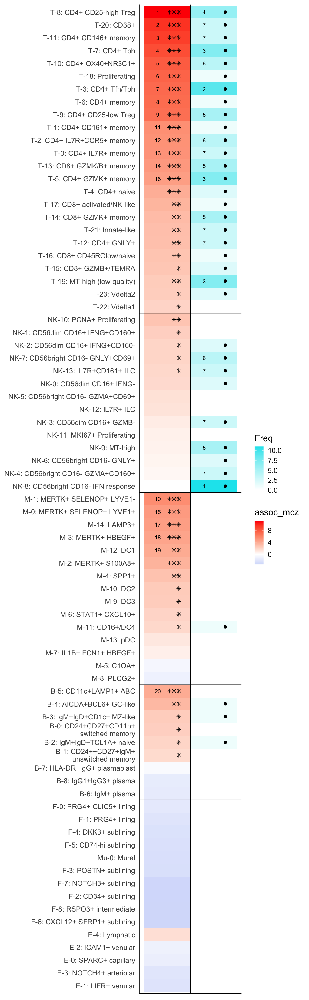

In [65]:
# assoc_mcz, prop_sig
options(repr.plot.height = nrow(data)/2.8, repr.plot.width =8.5 )
data <- micro_table
data2 <- scgwas_micro_count

ggplot(data) + 
geom_tile(aes(x=0.5, y=factor(group2, levels=ranked_cell_clusters), fill=assoc_mcz)) + 
scale_fill_gradient2(low="cornflowerblue", mid="white", high="red", midpoint=0) + 
geom_point(data = data[data$assoc_mcp < 0.05,], aes(x=0.75, y=factor(group2, levels=names(meta_colors))), size=2.5, color='black', shape=8) + 
geom_point(data = data[data$assoc_mcp < 0.01,], aes(x=0.65, y=factor(group2, levels=names(meta_colors))), size=2.5, color='black', shape=8) + 
geom_point(data = data[data$assoc_mcp < 0.001,], aes(x=0.55, y=factor(group2, levels=names(meta_colors))), size=2.5, color='black', shape=8) + 
geom_text(data=data[data$rank_assoc_mcz<21,], aes(x=0.3, y=reorder(group2, assoc_mcz), 
                                          label = rank_assoc_mcz)) +

new_scale("fill") +
geom_tile(data=data2, aes(x=1.5, y=group, fill=Freq)) + 
theme_classic(base_size =20) + xlim(0, 2) + xlab("scGWAS   scDRS") +
geom_point(data = data2[data2$Freq > 0,], aes(x=1.75, y=group), size=2.5, color='black', shape="circle") + 
geom_vline(xintercept=1) +
scale_fill_gradient2(low="cornflowerblue", mid="white", high="turquoise2", midpoint=0) + 
scale_y_discrete(ranked_cell_clusters) +
geom_text(data=data2[data2$rank_freq<8,], aes(x=1.3, y=factor(group, 
                                          levels=data2$group), 
                                          label = rank_freq)) +

theme_classic(base_size =17.5) + 
theme( 
      axis.text.x = element_blank(), legend.position="right", 
      axis.title.y = element_blank(), axis.ticks.y = element_blank(), 
     axis.ticks.x = element_blank(), axis.title.x = element_blank()) +
geom_hline(yintercept=5.5) + geom_hline(yintercept=15.5)+ geom_hline(yintercept=24.5)+ geom_hline(yintercept=39.5)+ geom_hline(yintercept=53.5) 


ggsave("../../output/Final_figures/RA/Micro_RA_SSComp.pdf", height=nrow(data)/2.8, width=8.5)

pdf 
  2

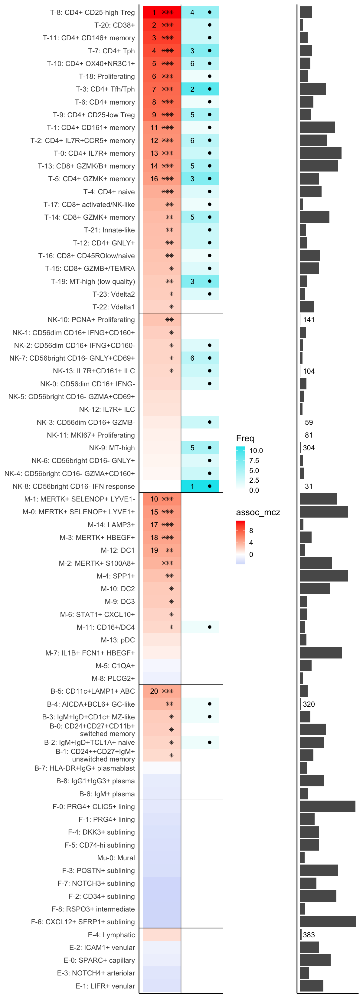

In [97]:
# assoc_mcz, prop_sig

data <- micro_table
#options(repr.plot.height = nrow(data)/2.8, repr.plot.width =7.2 )
data2 <- scgwas_micro_count
data2$group <- factor(data2$group, ranked_cell_clusters)

# 10kb
p1 <- ggplot(data) + 
geom_tile(aes(x=0.5, y=factor(group2, levels=ranked_cell_clusters), fill=assoc_mcz)) + 
scale_fill_gradient2(low="cornflowerblue", mid="white", high="red", midpoint=0) + 
geom_point(data = data[data$assoc_mcp < 0.05,], aes(x=0.75, y=factor(group2, levels=names(meta_colors))), size=2.5, color='black', shape=8) + 
geom_point(data = data[data$assoc_mcp < 0.01,], aes(x=0.65, y=factor(group2, levels=names(meta_colors))), size=2.5, color='black', shape=8) + 
geom_point(data = data[data$assoc_mcp < 0.001,], aes(x=0.55, y=factor(group2, levels=names(meta_colors))), size=2.5, color='black', shape=8) + 
#geom_point(data = data[data$hetero_mcp < 0.05,], aes(x=0.75, y=factor(group, levels=names(meta_colors)), size = hetero_mcz), color='black') + 
geom_text(data=data[data$rank_assoc_mcz<21,], aes(x=0.3, y=reorder(group2, assoc_mcz), 
                                          label = rank_assoc_mcz), size=5) +


new_scale("fill") +
geom_tile(data=data2, aes(x=1.5, y=group, fill=Freq)) + 
theme_classic(base_size =20)  + xlab("scGWAS   scDRS\n") +
geom_vline(xintercept=1) +
geom_point(data = data2[data2$Freq > 0,], aes(x=1.75, y=group), size=2.5, color='black', shape="circle") + 
scale_fill_gradient2(low="cornflowerblue", mid="white", high="turquoise2", midpoint=0) + 
#scale_y_discrete(ranked_cell_clusters) +
geom_text(data=data2[data2$rank_freq<7,], aes(x=1.3, y=factor(group, 
                                          levels=data2$group), 
                                          label = rank_freq), size=5) +



theme_classic(base_size =17.5) + xlab("scGWAS   scDRS")  +
theme( axis.title.x = element_blank(),
      axis.text.x = element_blank(), legend.position="right", #legend.position="right", 
      axis.title.y = element_blank(), axis.ticks.y = element_blank(), 
     axis.ticks.x = element_blank()) + #, axis.title.x = element_blank()) + 
geom_hline(yintercept=5.5) + geom_hline(yintercept=15.5)+ geom_hline(yintercept=24.5)+ geom_hline(yintercept=39.5)+ geom_hline(yintercept=53.5) 

p2 <- ggplot(data) + geom_bar(data=data, aes(x=n_cell, y=factor(group2, levels=ranked_cell_clusters)), stat="identity")  +
theme_classic(base_size =17.5) + 
#geom_vline(xintercept=2) +
#scale_fill_gradient(low="white", high="grey") + 
geom_text(data=data[data$n_cell < 500,], aes(x=2000, y=factor(group2, levels=ranked_cell_clusters), label=n_cell), size=5) +
theme(axis.text.x = element_blank(), legend.position="right", axis.text.y = element_blank(),
      axis.title.y = element_blank(), axis.ticks.y = element_blank(), 
     axis.ticks.x = element_blank(), axis.title.x = element_blank())#axis.text.x = element_text(angle=90),
options(repr.plot.height = nrow(data)/2.8, repr.plot.width =10)
p <- plot_grid(p1, p2, nrow=1, rel_widths=c(2,.5))
p
pdf("../../output/Final_figures/RA/Micro_RA_SSComp_withcellcounts.pdf", height=nrow(data)/2.8, width=11)
print(p)
dev.off()


pdf 
  2

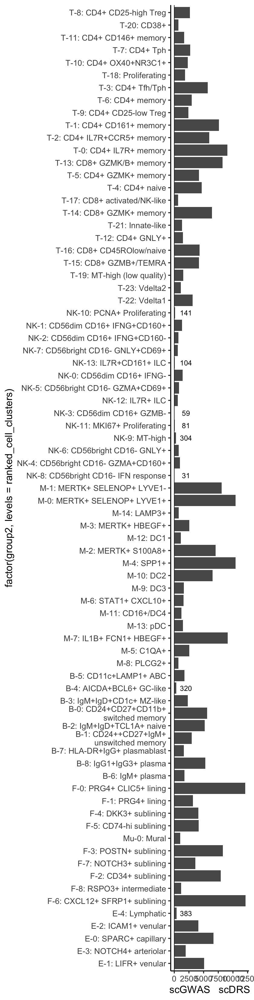

In [93]:
options(repr.plot.height = nrow(data)/2.8, repr.plot.width =7)
p1 <- ggplot(data) + geom_bar(data=micro_table, aes(x=n_cell, y=factor(group2, levels=ranked_cell_clusters)), stat="identity")  +
theme_classic(base_size =20) + xlab("scGWAS   scDRS") +
geom_vline(xintercept=2) +
#scale_fill_gradient(low="white", high="grey") + 
geom_text(data=micro_table[micro_table$n_cell < 500,], aes(x=2000, y=factor(group2, levels=ranked_cell_clusters), label=n_cell), size=5) 
#scale_y_discrete(ranked_cell_clusters) 
p1

pdf("../../output/Final_figures/RA/Micro_RA_cellcounts.pdf", height=nrow(data)/2.8, width=7)
print(p1)
dev.off()

## 7. Look at individual cells for scDRS results (UMAP)

### Read in reference data & prep for plotting

In [68]:
# read in the reference data
data_dir <- "/Users/hopekirby/Desktop/IanLaura_Colab/data/amp2_ref/"
# Myeloid cells
cell_file = "myeloid_reference_2021-04-29.rds"
ref_cell_mac = readRDS(paste(data_dir, cell_file, sep=''))
ref_cell_mac$save_uwot_path <- paste0(data_dir, "myeloid_uwot_model_2021-04-29")

# Fibroblasts
cell_file = "fibroblast_reference_2021-09-10.rds"
ref_cell_fib = readRDS(paste(data_dir, cell_file, sep=''))
ref_cell_fib$save_uwot_path <- paste0(data_dir, "fibroblast_uwot_model_2021-04-29")

# Bcells
cell_file = "Bcell_reference_2023-03-12"
ref_cell_b = readRDS(paste(data_dir, cell_file, sep=''))
ref_cell_b$save_uwot_path <- paste0(data_dir, "Bcell_uwot_model_2021-05-03")

# Tcells
cell_file = "T_reference_2023-03-12.rds"
ref_cell_t = readRDS(paste(data_dir, cell_file, sep=''))
ref_cell_t$save_uwot_path <- paste0(data_dir, "T_uwot_model_2020-11-25")

# NK cells
cell_file = "NK_reference_2023-02-14.rds"
ref_cell_nk = readRDS(paste(data_dir, cell_file, sep=''))
ref_cell_nk$save_uwot_path <- paste0(data_dir, "NK_uwot_model_2020-11-25")

# Endothelial
cell_file = "endothelial_reference_2023-03-12.rds"
ref_cell_end = readRDS(paste(data_dir, cell_file, sep=''))
ref_cell_end$save_uwot_path <- paste0(data_dir, "endothelial_uwot_model_2021-04-29")

In [69]:
# combine the umap info w/ meta data
umap_labels_mac = cbind(ref_cell_mac$meta_data[,c("cell", "sample", "cluster_name")], ref_cell_mac$umap$embedding)
umap_labels_fib = cbind(ref_cell_fib$meta_data[,c("cell", "sample", "cluster_name")], ref_cell_fib$umap$embedding)
umap_labels_b = cbind(ref_cell_b$meta_data[,c("cell", "sample", "cluster_name")], ref_cell_b$umap$embedding)
umap_labels_t = cbind(ref_cell_t$meta_data[,c("cell", "sample", "cluster_name")], ref_cell_t$umap$embedding)
umap_labels_nk = cbind(ref_cell_nk$meta_data[,c("cell", "sample", "cluster_name")], ref_cell_nk$umap$embedding)
umap_labels_end = cbind(ref_cell_end$meta_data[,c("cell", "sample", "cluster_name")], ref_cell_end$umap$embedding)

# add celltype to each
umap_labels_mac$cell_type = rep("Macrophage", nrow(umap_labels_mac))
umap_labels_fib$cell_type = rep("Fibroblast", nrow(umap_labels_fib))
umap_labels_b$cell_type = rep("B cell", nrow(umap_labels_b))
umap_labels_t$cell_type = rep("T cell", nrow(umap_labels_t))
umap_labels_nk$cell_type = rep("NK cell", nrow(umap_labels_nk))
umap_labels_end$cell_type = rep("Endothelial cell", nrow(umap_labels_end))
# 

rm(ref_cell_fib)
rm(ref_cell_mac)
rm(ref_cell_b)
rm(ref_cell_t)
rm(ref_cell_nk)
rm(ref_cell_end)
gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,3000367,160.3,5584367,298.3,5584367,298.3
Vcells,17640043,134.6,54063091,412.5,67531626,515.3


In [70]:
# get the cluster centers for graphing
cluster_center <- umap_labels_mac %>%
                  group_by(cluster_name) %>%
                  summarise_at(vars(UMAP1, UMAP2), list(median))#funs(median(., na.rm=TRUE)))
cluster_center_mac <- as.data.frame(cluster_center)
cluster_center <- umap_labels_fib %>%
                  group_by(cluster_name) %>%
                  summarise_at(vars(UMAP1, UMAP2), list(median))#funs(median(., na.rm=TRUE)))
cluster_center_fib <- as.data.frame(cluster_center)
cluster_center <- umap_labels_b %>%
                  group_by(cluster_name) %>%
                  summarise_at(vars(UMAP1, UMAP2), list(median))#funs(median(., na.rm=TRUE)))
cluster_center_b <- as.data.frame(cluster_center)
cluster_center <- umap_labels_t %>%
                  group_by(cluster_name) %>%
                  summarise_at(vars(UMAP1, UMAP2), list(median))#funs(median(., na.rm=TRUE)))
cluster_center_t <- as.data.frame(cluster_center)
cluster_center <- umap_labels_nk %>%
                  group_by(cluster_name) %>%
                  summarise_at(vars(UMAP1, UMAP2), list(median))#funs(median(., na.rm=TRUE)))
cluster_center_nk <- as.data.frame(cluster_center)
cluster_center <- umap_labels_end %>%
                  group_by(cluster_name) %>%
                  summarise_at(vars(UMAP1, UMAP2), list(median))#funs(median(., na.rm=TRUE)))
cluster_center_end <- as.data.frame(cluster_center)

In [71]:
dim(umap_labels_mac)
dim(umap_labels_fib)
dim(umap_labels_b)
dim(umap_labels_t)
dim(umap_labels_nk)
dim(umap_labels_end)
colnames(umap_labels_mac)
colnames(umap_labels_fib)
colnames(umap_labels_t)


[1] 76181     6

[1] 79555     6

[1] 30691     6

[1] 94046     6

[1] 8495    6

[1] 25043     6

[1] "cell"         "sample"       "cluster_name" "UMAP1"        "UMAP2"       
[6] "cell_type"

[1] "cell"         "sample"       "cluster_name" "UMAP1"        "UMAP2"       
[6] "cell_type"

[1] "cell"         "sample"       "cluster_name" "UMAP1"        "UMAP2"       
[6] "cell_type"

In [72]:
# Combine the matrices into one
full_meta_umap <- rbind(umap_labels_mac, umap_labels_fib, 
                       umap_labels_b, umap_labels_t, 
                       umap_labels_nk, umap_labels_end)
sum(nrow(umap_labels_mac), nrow(umap_labels_fib), 
    nrow(umap_labels_b), nrow(umap_labels_t), 
    nrow(umap_labels_nk), nrow(umap_labels_end))

dim(full_meta_umap)

[1] 314011

[1] 314011      6

In [73]:
# free up memory
rm(umap_labels_mac)
rm(umap_labels_fib)
rm(umap_labels_b)
rm(umap_labels_t)
rm(umap_labels_nk)
rm(umap_labels_end)
gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,3137079,167.6,5584367,298.3,5584367,298.3
Vcells,16156725,123.3,54063091,412.5,67531626,515.3


In [74]:
meta_data[1:2,]
table(meta_data$cell_type)
table(full_meta_umap$cell_type)
# order the gene scores according to the z score
meta_data <- meta_data[order(-meta_data$zscore),]
meta_data[1:2,]

,sample,cell,cluster_number,cluster_name,cell_type,subject_id,percent.mito,nGene,nUMI,redcap_data_access_group,⋯,sex,RA_duration_years,Race_white,V1,raw_score,norm_score,mc_pval,pval,nlog10_pval,zscore
,<chr>,<chr>,<chr>,<fct>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
BRI-546_GCACATAAGTGAGCCA,BRI-546,BRI-546_GCACATAAGTGAGCCA,T-7,T-7: CD4+ Tph,T cell,300-0144,0.04844938,4279,16574,university_of_roch,⋯,1,12.69041,1,BRI-546_GCACATAAGTGAGCCA,0.1249269,7.329573,0.000999001,1.903341e-08,7.720483,5.499593
BRI-429_AACACACGTCAAATCC,BRI-429,BRI-429_AACACACGTCAAATCC,T-8,T-8: CD4+ CD25-high Treg,T cell,300-2662,0.08416011,3657,14615,columbia_universit,⋯,1,10.16712,0,BRI-429_AACACACGTCAAATCC,0.1240100,7.223198,0.000999001,2.284009e-08,7.641302,5.467355



     B cell Endothelial  Fibroblast     Myeloid          NK      T cell 
      26771       18241       57705       65189        7925       86865 


          B cell Endothelial cell       Fibroblast       Macrophage 
           30691            25043            79555            76181 
         NK cell           T cell 
            8495            94046 

,sample,cell,cluster_number,cluster_name,cell_type,subject_id,percent.mito,nGene,nUMI,redcap_data_access_group,⋯,sex,RA_duration_years,Race_white,V1,raw_score,norm_score,mc_pval,pval,nlog10_pval,zscore
,<chr>,<chr>,<chr>,<fct>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
BRI-546_GCACATAAGTGAGCCA,BRI-546,BRI-546_GCACATAAGTGAGCCA,T-7,T-7: CD4+ Tph,T cell,300-0144,0.04844938,4279,16574,university_of_roch,⋯,1,12.69041,1,BRI-546_GCACATAAGTGAGCCA,0.1249269,7.329573,0.000999001,1.903341e-08,7.720483,5.499593
BRI-429_AACACACGTCAAATCC,BRI-429,BRI-429_AACACACGTCAAATCC,T-8,T-8: CD4+ CD25-high Treg,T cell,300-2662,0.08416011,3657,14615,columbia_universit,⋯,1,10.16712,0,BRI-429_AACACACGTCAAATCC,0.1240100,7.223198,0.000999001,2.284009e-08,7.641302,5.467355


In [75]:
full_meta_umap[1:2,]

,cell,sample,cluster_name,UMAP1,UMAP2,cell_type
,<chr>,<chr>,<fct>,<dbl>,<dbl>,<chr>
4,BRI-399_AAACCCAGTAGGAGGG,BRI-399,M-10: DC2,-5.021373,-4.028395,Macrophage
28,BRI-399_AAACGCTGTTCAAGTC,BRI-399,M-10: DC2,-5.620600,-4.745194,Macrophage


In [76]:
# filter
dim(full_meta_umap)
full_meta_umap <- full_meta_umap[full_meta_umap$ cell %in% rownames(meta_data),]
dim(full_meta_umap)
rownames(full_meta_umap) <- full_meta_umap$cell
dim(meta_data)
length(setdiff(meta_data$cell, rownames(full_meta_umap)))

[1] 314011      6

[1] 262696      6

[1] 262696     21

[1] 0

In [77]:
full_meta_umap <- full_meta_umap[meta_data$cell,]
full_meta_umap_score <- cbind(full_meta_umap, meta_data[,c("V1", "raw_score", "norm_score", 
                                                    "mc_pval", "pval", "nlog10_pval", "zscore")])
dim(full_meta_umap_score)
identical(full_meta_umap_score$cell, full_meta_umap_score$V1)

[1] 262696     13

[1] TRUE

Warning message:
“ggrepel: 12 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 7 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 5 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 23 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 11 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


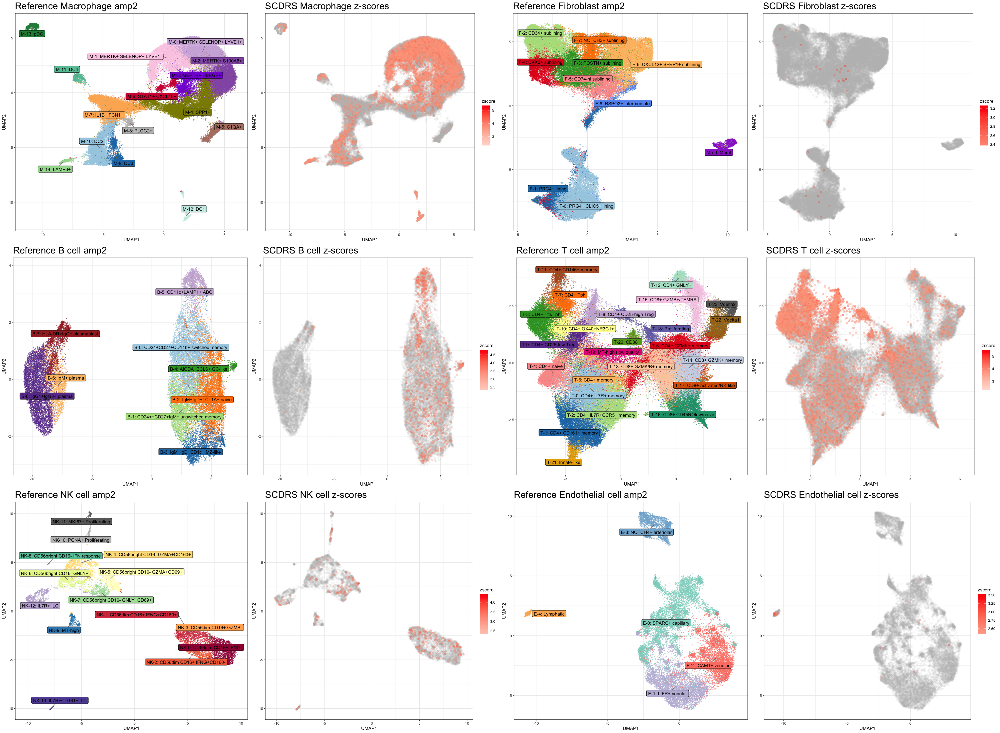

In [170]:
# For each cell type, graph the reference next to the lower dimension with zscoresl
library(ggrepel)
# to see if any clear patterns
cell_list = list("Macrophage", "Fibroblast", 
                 "B cell", "T cell", 
                "NK cell", "Endothelial cell")
cell_type_cluster_dict = list("Macrophage" = cluster_center_mac, "Fibroblast" = cluster_center_fib, 
                              "B cell" = cluster_center_b, "T cell" = cluster_center_t,
                              "NK cell" = cluster_center_nk, "Endothelial cell" = cluster_center_end)
cell_type_color_dict = list("Macrophage" = meta_colors_mac, "Fibroblast" = meta_colors_fib, 
                              "B cell" = meta_colors_b, "T cell" = meta_colors_t,
                              "NK cell" = meta_colors_nk, "Endothelial cell" = meta_colors_end)
plot_scores <- function(cell_type) {
    # filter the data to only include cell type of interest
    umap_labels = full_meta_umap_score[full_meta_umap_score$cell_type == cell_type,]
    # plot the reference data
    p1 <- ggplot(umap_labels[sample(nrow(umap_labels)),],
           aes(x = UMAP1, y = UMAP2, fill= cluster_name)
          ) +
      geom_point(size = 1, stroke = 0.0001, shape = 21, alpha = 0.7) +
      geom_label_repel(
        data = cell_type_cluster_dict[[cell_type]],
        aes(label = cluster_name),
    #     fontface = 'bold', 
        size = 3.5, 
        box.padding = unit(0.6, "lines"),
        point.padding = unit(0.2, "lines"),
        segment.color = 'grey50'
      ) +
      scale_fill_manual(values = cell_type_color_dict[[cell_type]], name = "") +
      labs(
          x = "UMAP1",
          y = "UMAP2",
          title = paste("Reference", cell_type, "amp2")
          ) +
      theme_bw(base_size = 10) +
      theme(
        legend.position = "none",
    #     panel.grid = element_blank(),
        plot.title = element_text(color="black", size=20) 
    )
    # plot the z score
    p2 <- ggplot() +
    geom_point(data = subset(umap_labels, pval > 0.05), aes(x = UMAP1, y = UMAP2), alpha=0.1, color = "grey") +
        #geom_point(data = umap_labels[umap_labels$pval < 0.05,], aes(x = UMAP1, y = UMAP2, color=zscore), alpha=0.3) +
        geom_point(data = umap_labels[umap_labels$pval < 0.01,], aes(x = UMAP1, y = UMAP2, color=zscore), alpha=0.3) +
        scale_color_gradient2(low = "#132B43", mid=NA, high = "red") + 
        labs(
          x = "UMAP1",
          y = "UMAP2",
          title = paste("SCDRS", cell_type, "z-scores")
          ) +
        theme_bw(base_size = 10) +
      theme(
    #     panel.grid = element_blank(),
        plot.title = element_text(color="black", size=20) 
    )
    plot_grid(p1, p2)
    }
plot_list <- map(cell_list, plot_scores)
options(repr.plot.height = 22, repr.plot.width =30 )
plots <- plot_grid(plotlist = plot_list, nrow = 3 , align = "h")
plots
ggsave("scDRS_RA_umap_plots_pval01.png", plots, width=30, height=22)